# Download

https://mapreader.readthedocs.io/en/latest/User-guide/Download.html

In [62]:
from mapreader import SheetDownloader

my_ts = SheetDownloader(
    metadata_path="../NLS_metadata/metadata_OS_One_Inch_GB_WFS_light.json",
    download_url="https://geo.nls.uk/maps/os/1inch_2nd_ed/{z}/{x}/{y}.png",
)

[INFO] Metadata file has 480 item(s).


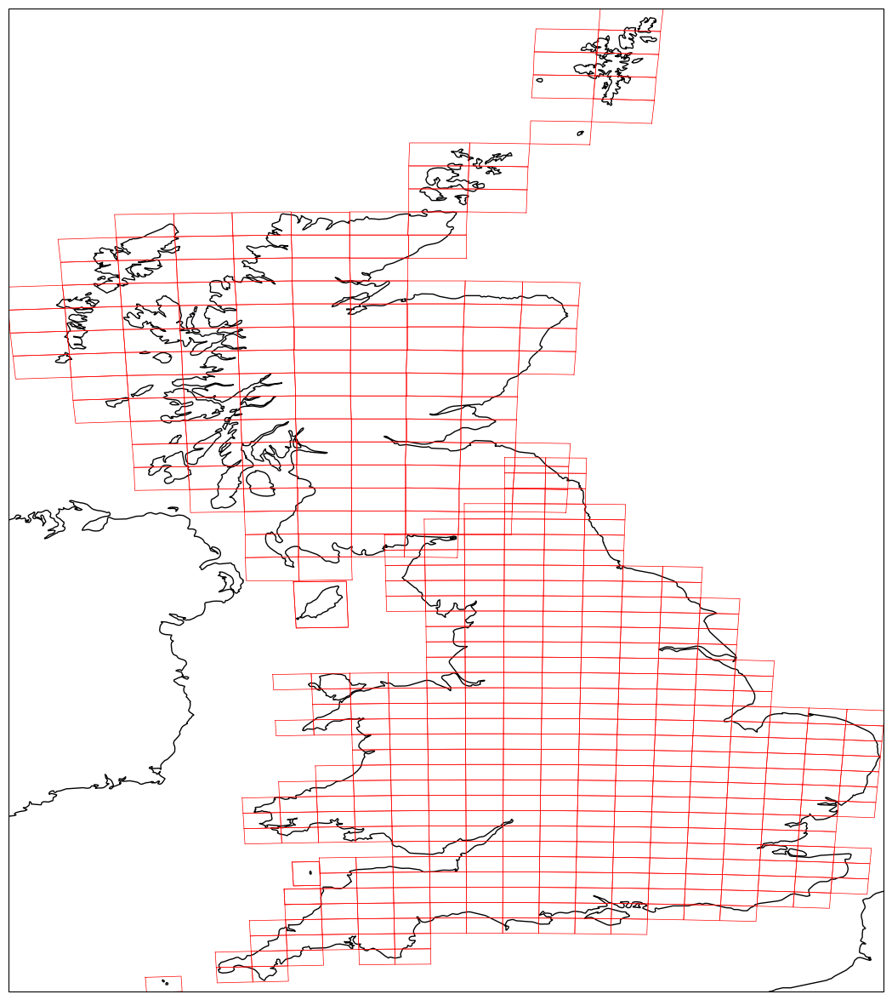

In [63]:
my_ts.extract_wfs_id_nos()
my_ts.plot_all_metadata_on_map(map_extent="uk", add_id=False)

In [64]:
my_ts.get_minmax_latlon()

[INFO] Min lat: 49.82091681, max lat: 60.97000003 
[INFO] Min lon: -8.11999993, max lon: 1.83188116


1873 1909 36


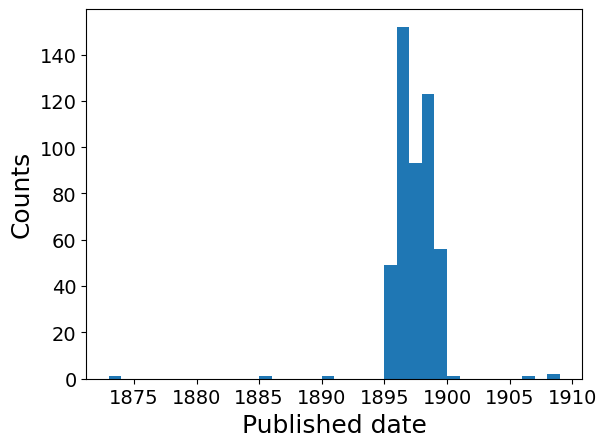

In [65]:
my_ts.extract_published_dates()
my_ts.hist_published_dates()


## Query maps using a list of lats/lons

In [66]:
my_ts.query_map_sheets_by_coordinates((-4.33, 55.90))
my_ts.query_map_sheets_by_coordinates((-3.25, 51.93), append=True)

In [67]:
my_ts.print_found_queries()

Query results:
URL:     	https://maps.nls.uk/view/74488689
coordinates (bounds):  	(-4.82999994, 55.79000003, -4.20999993, 56.05000003)
--------------------
URL:     	https://maps.nls.uk/view/101168342
coordinates (bounds):  	(-3.33544762, 51.87891401, -2.91228731, 52.05404182)
--------------------


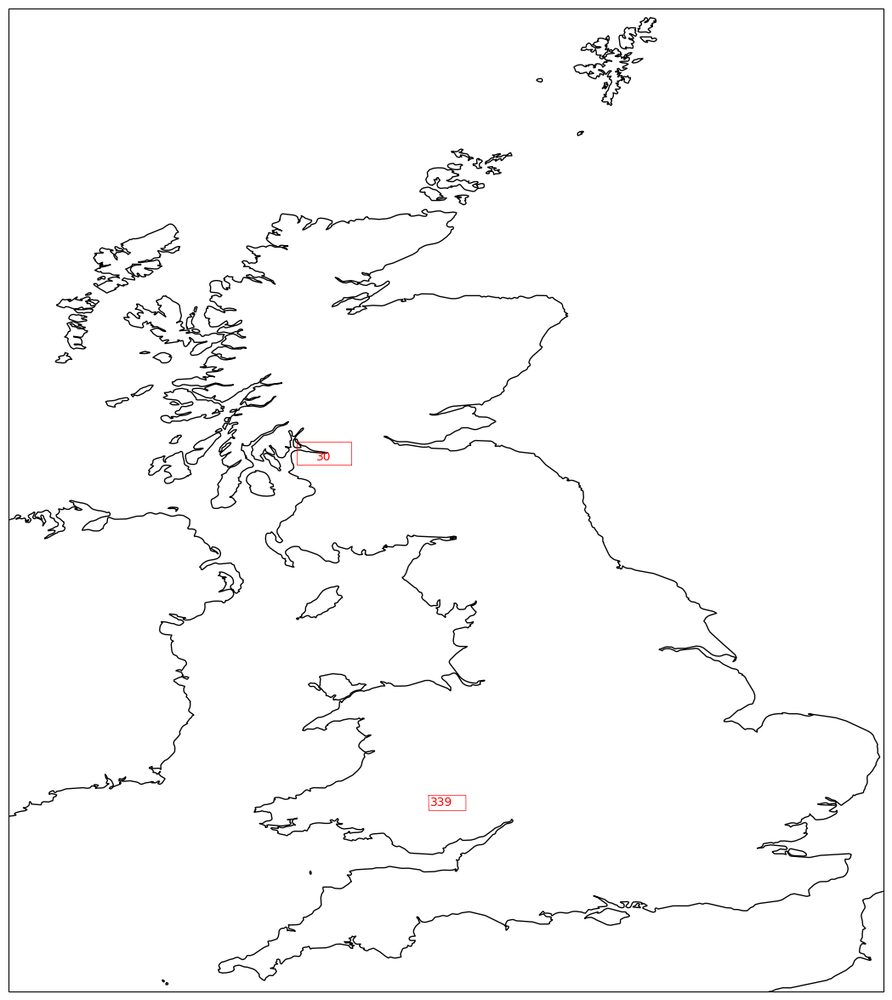

In [68]:
my_ts.plot_queries_on_map(map_extent="uk")

## Download map tiles

In [69]:
my_ts.get_grid_bb(zoom_level=14)
my_ts.download_map_sheets_by_queries(overwrite=True)

  0%|          | 0/2 [00:00<?, ?it/s]

[INFO] Downloaded "map_74488689.png"
[INFO] Downloaded "map_101168342.png"


# Load

https://mapreader.readthedocs.io/en/latest/User-guide/Load.html

## Load in downloaded maps

In [2]:
from mapreader import loader

In [3]:
my_files = loader("./maps/*png")

  0%|          | 0/2 [00:00<?, ?it/s]

In [4]:
# len() shows the total number of images currently read (or sliced, see below)
print(f"Number of images: {len(my_files)}")

Number of images: 2


In [5]:
print(my_files)

#images: 2

#parents: 2
map_74488689.png
map_101168342.png

#patches: 0



In [6]:
my_files.add_metadata("./maps/metadata.csv")

In [7]:
parent_list = my_files.list_parents()

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 1 Axes>]

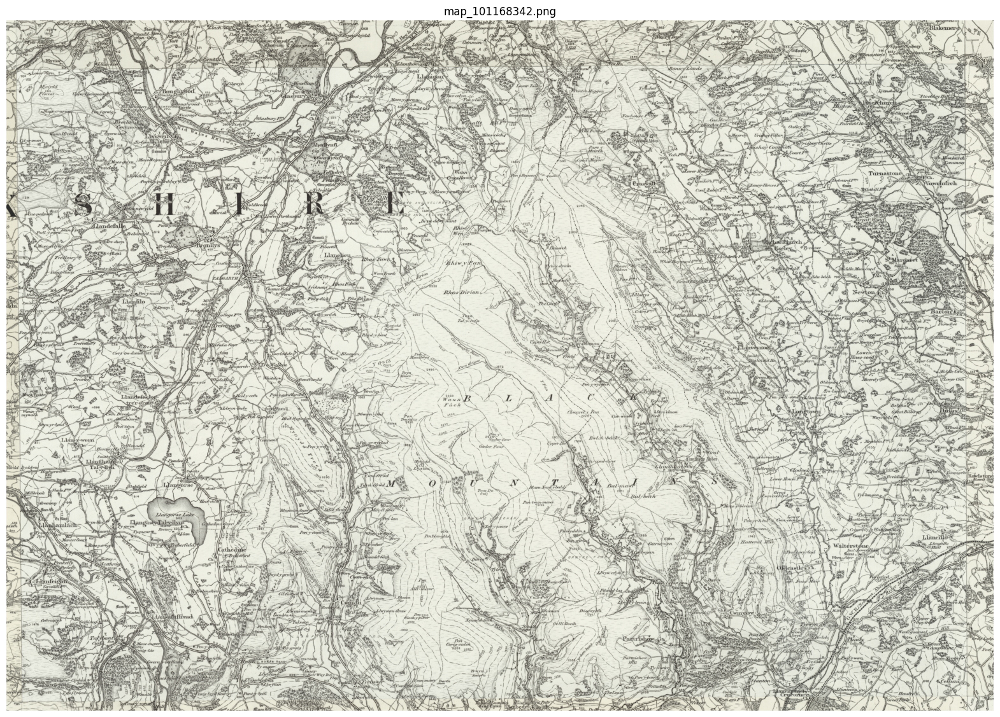

In [8]:
my_files.show(parent_list[1], figsize=(20, 20))

## Patchify maps

In [9]:
my_files.patchify_all(patch_size=100)  # in pixels

[INFO] Saving patches in directory named "patches_100_pixel".


  0%|          | 0/2 [00:00<?, ?it/s]

maps/map_74488689.png
maps/map_101168342.png


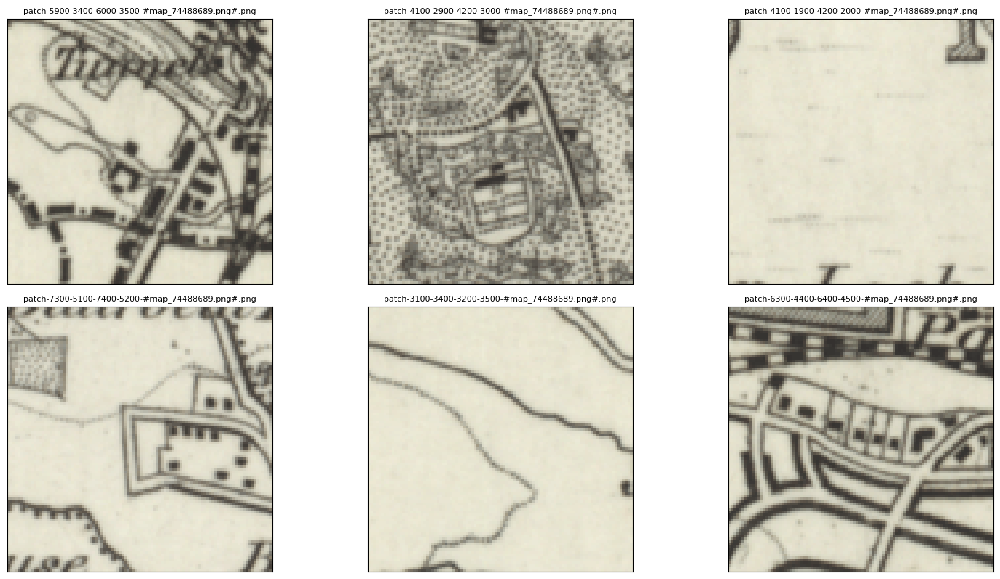

In [10]:
my_files.show_sample(num_samples=6, tree_level="patch")

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 1500x1500 with 1 Axes>]

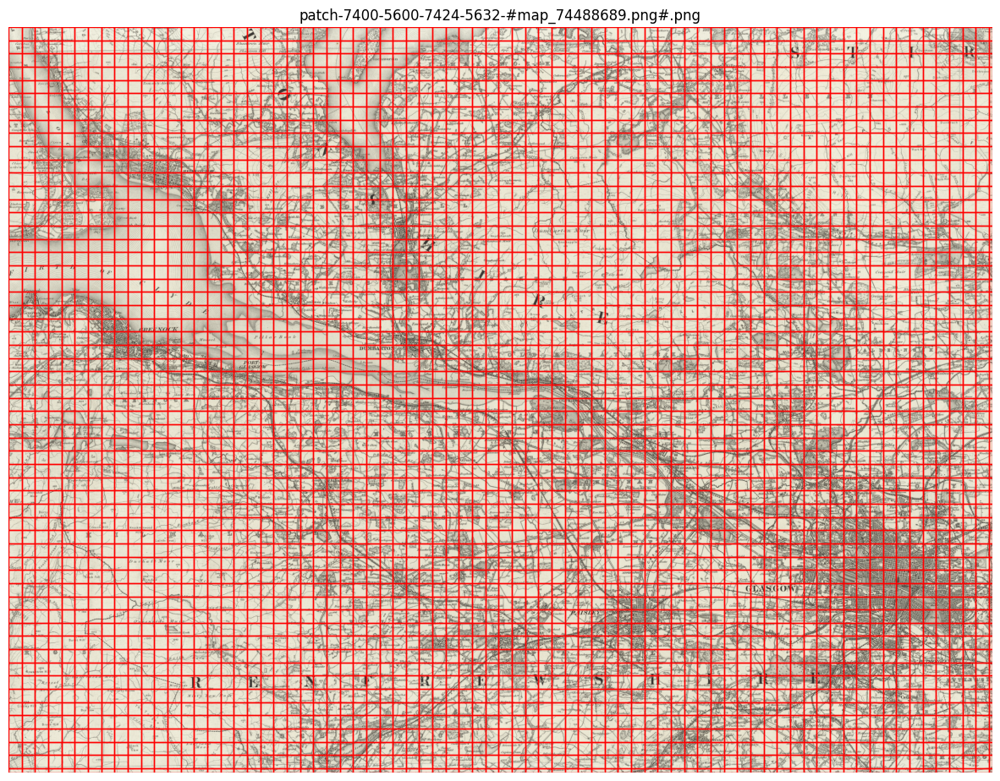

In [11]:
my_files.show_parent(
    parent_list[0], patch_border=True, plot_parent=True, figsize=(15, 15)
)

## Calculate pixel intensities

In [12]:
my_files.calc_pixel_stats()

  0%|          | 0/2 [00:00<?, ?it/s]

In [13]:
parent_df, patch_df = my_files.convert_images(save=True)

[INFO] Saved parent dataframe as "parent_df.csv"
[INFO] Saved patch dataframe as "patch_df.csv"


In [82]:
parent_df.head()

,parent_id,image_path,shape,name,url,coordinates,crs,published_date,grid_bb,patches,dlon,dlat
image_id,,,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(5632, 7424, 4)",map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.78892895389263, -4.196777343...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","[patch-0-0-100-100-#map_74488689.png#.png, pat...",0.000086,0.000048
map_101168342.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3584, 5120, 4)",map_101168342.png,https://maps.nls.uk/view/101168342,"(-3.33984375, 51.87649097061476, -2.900390625,...",EPSG:4326,1896,"[(14, 8040, 5407)x(14, 8059, 5420)]","[patch-0-0-100-100-#map_101168342.png#.png, pa...",0.000086,0.000053


In [83]:
patch_df.head()

,parent_id,image_path,shape,pixel_bounds,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_A
image_id,,,,,,,,,,,,,,,
patch-0-0-100-100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 0, 100, 100)","(-4.833984375, 56.0549605209174, -4.8254013061...",EPSG:4326,"POLYGON ((-4.825401306152344 56.0549605209174,...",0.882480,0.875822,0.814781,1.000000,0.092767,0.095471,0.091923,0.000000
patch-0-100-100-200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 100, 100, 200)","(-4.833984375, 56.050151562728225, -4.82540130...",EPSG:4326,POLYGON ((-4.825401306152344 56.05015156272822...,0.844518,0.836567,0.775709,0.999144,0.122864,0.126680,0.121811,0.020511
patch-0-200-100-300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 200, 100, 300)","(-4.833984375, 56.04534260453906, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.04534260453906...,0.795914,0.784561,0.719604,1.000000,0.104913,0.107458,0.103096,0.000000
patch-0-300-100-400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 300, 100, 400)","(-4.833984375, 56.04053364634989, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.04053364634989...,0.736126,0.723507,0.660471,1.000000,0.132483,0.136058,0.130438,0.000000
patch-0-400-100-500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 400, 100, 500)","(-4.833984375, 56.03572468816073, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.03572468816073...,0.783474,0.770846,0.705413,1.000000,0.127172,0.129634,0.123469,0.000000


In [84]:
patch_df.mean()

mean_pixel_R    0.795501
mean_pixel_G    0.787198
mean_pixel_B    0.725992
mean_pixel_A    0.999961
std_pixel_R     0.148580
std_pixel_G     0.151103
std_pixel_B     0.142832
std_pixel_A     0.000813
dtype: float64

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 2 Axes>]

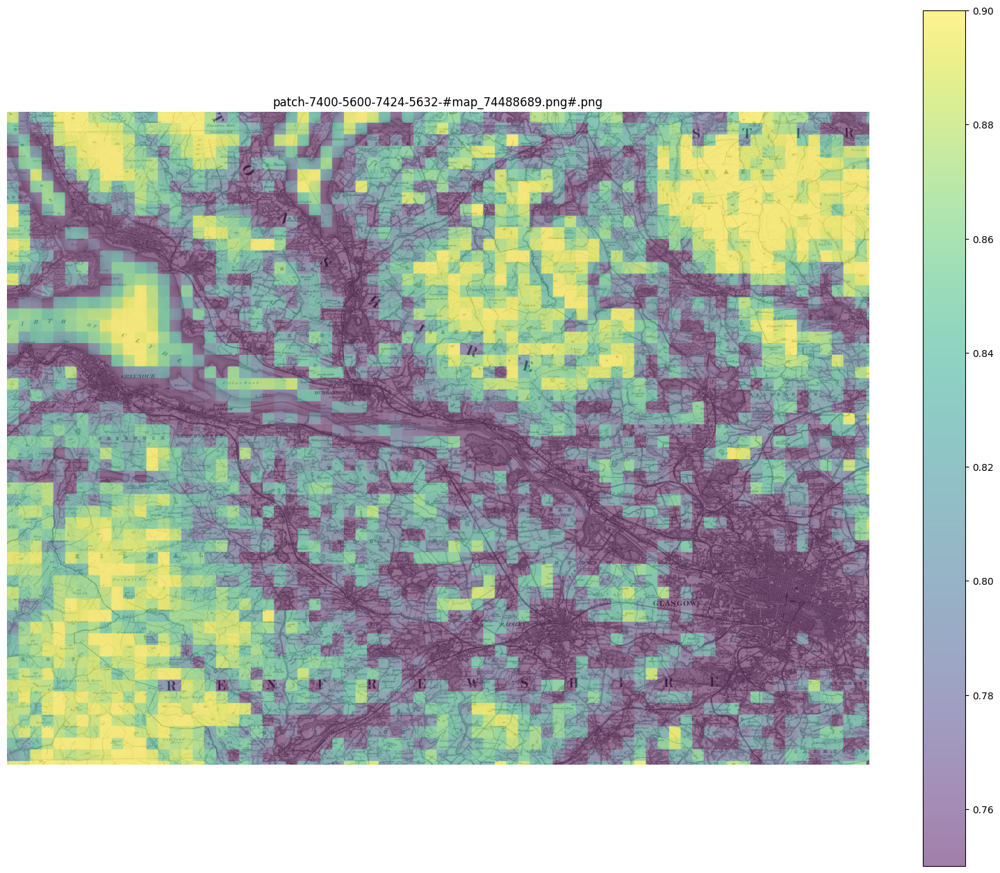

In [85]:
my_files.show_parent(
    parent_list[0],
    column_to_plot="mean_pixel_R",
    patch_border=False,
    plot_parent=True,
    vmin=0.75,
    vmax=0.9,
    figsize=(20, 20),
    alpha=0.5,
)

# Annotate
https://mapreader.readthedocs.io/en/latest/User-guide/Annotate.html

In [2]:
from mapreader import Annotator

In [3]:
annotator = Annotator(
    patch_paths="./patches_100_pixel/*png",
    parent_paths="./maps/*png",
    metadata_path="./maps/metadata.csv",
    annotations_dir="./annotations_one_inch",
    labels=["no", "railspace"],
    username="rw",
    task_name="railspace",
    sortby="mean_pixel_R",
)

[INFO] Loading patches from ./patches_100_pixel/*png.
[INFO] Loading parents from ./maps/*png.


0it [00:00, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/6147 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

[INFO] Adding metadata from ./maps/metadata.csv.
[INFO] Loading existing patch annotations.


In [4]:
annotator.annotate()

Output(layout=Layout(align_items='center', display='flex', flex_flow='column'))

# Train
https://mapreader.readthedocs.io/en/latest/User-guide/Classify.html

## Read annotations

In [14]:
from mapreader import AnnotationsLoader

In [15]:
annotated_images = AnnotationsLoader()

annotated_images.load("./annotations_one_inch/rail_space_#rw#.csv", images_dir="./patches_100_pixel")

[INFO] Reading "./annotations_one_inch/rail_space_#rw#.csv"
[WARNING] 9 files cannot be found.
Check '/Users/rwood/LwM/mapreader/MapReader/worked_examples/geospatial/classification_one_inch_maps/broken_paths.txt' for more details and, if possible, update your file paths using the 'images_dir' argument.
[INFO] Annotations with broken file paths have been removed.
Number of annotations remaining: 230
[INFO] Number of annotations:   230

[INFO] Number of instances of each label (from column "label"):
    - no:  176
    - railspace:  54



In [16]:
annotated_images.annotations

,parent_id,image_path,pixel_bounds,label,label_index
image_id,,,,,
patch-2900-1900-3000-2000-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2900, 1900, 3000, 2000)",no,0
patch-6900-4300-7000-4400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(6900, 4300, 7000, 4400)",no,0
patch-6600-4200-6700-4300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(6600, 4200, 6700, 4300)",no,0
patch-6600-4100-6700-4200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(6600, 4100, 6700, 4200)",no,0
patch-0-2100-100-2200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(0, 2100, 100, 2200)",no,0
...,...,...,...,...,...
patch-900-200-1000-300-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(900, 200, 1000, 300)",no,0
patch-3400-5300-3500-5400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3400, 5300, 3500, 5400)",no,0
patch-2600-2000-2700-2100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2600, 2000, 2700, 2100)",no,0


In [17]:
print(annotated_images)

[INFO] Number of annotations:   230

[INFO] Number of instances of each label (from column "label"):
    - no:  176
    - railspace:  54



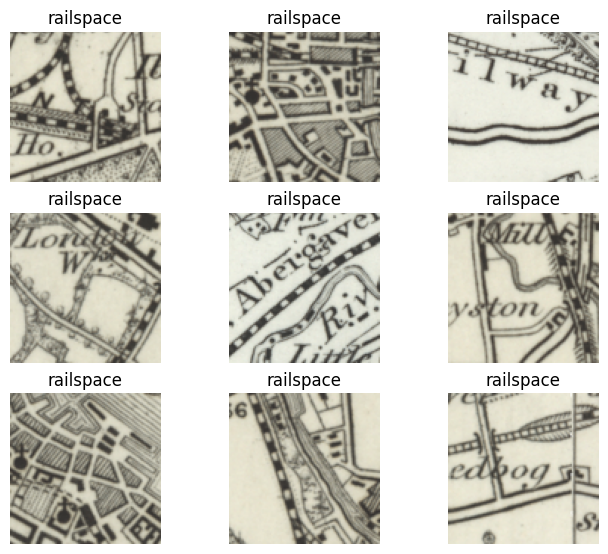

In [18]:
# show sample images for target label (tar_label)
annotated_images.show_sample(label_to_show="railspace")

[INFO] Type "exit", "end" or "stop" to exit.
[INFO] Showing 0-24 out of 230.


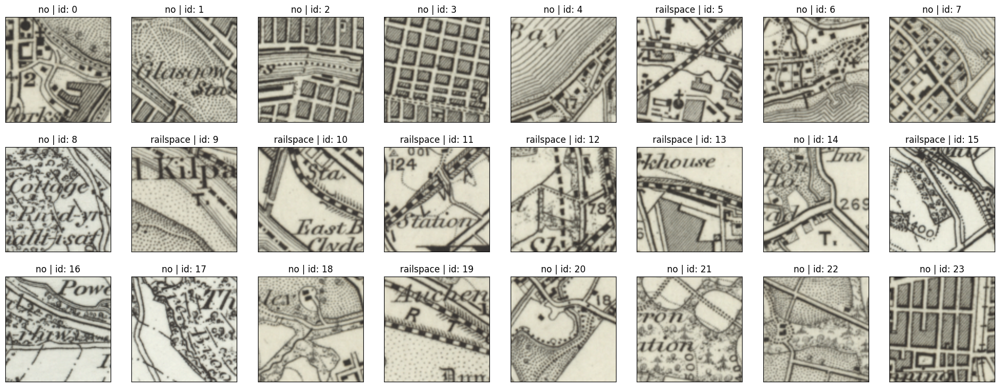

[INFO] IDs of current patches: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
[INFO] Exited.


In [19]:
annotated_images.review_labels()

## Prepare datasets and dataloaders

In [20]:
annotated_images.create_datasets(frac_train=0.7, frac_val=0.2, frac_test=0.1)

[INFO] Number of annotations in each set:
    - train:   161
    - val:   46
    - test:   23


In [21]:
annotated_images.datasets["train"].patch_df.head()

,parent_id,image_path,pixel_bounds,label,label_index
image_id,,,,,
patch-1600-100-1700-200-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1600, 100, 1700, 200)",no,0
patch-3300-2600-3400-2700-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3300, 2600, 3400, 2700)",no,0
patch-3500-4000-3600-4100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3500, 4000, 3600, 4100)",no,0
patch-2800-1400-2900-1500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2800, 1400, 2900, 1500)",no,0
patch-2800-600-2900-700-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2800, 600, 2900, 700)",no,0


In [22]:
annotated_images.labels_map

{0: 'no', 1: 'railspace'}

In [23]:
dataloaders = annotated_images.create_dataloaders(batch_size=8)

[INFO] Using default sampler.


## Set up `ClassifierContainer`

### Load a pretrained PyTorch model, dataloaders and labels map

In [24]:
from mapreader import ClassifierContainer

In [25]:
my_classifier = ClassifierContainer(model ="resnet18",
                                    labels_map={0: 'No', 1: 'railspace'},
                                    dataloaders=dataloaders,
                                    )

[INFO] Device is set to cpu
[INFO] Initializing model.
[INFO] Loaded "train" with 161 items.
[INFO] Loaded "val" with 46 items.
[INFO] Loaded "test" with 23 items.


In [26]:
my_classifier.labels_map

{0: 'No', 1: 'railspace'}

[INFO] dataset: train
        - items:        161
        - batch size:   8
        - batches:      21


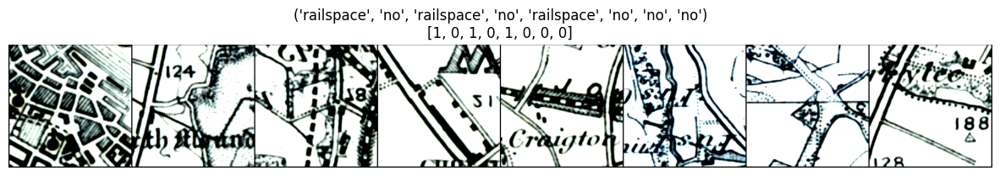

In [27]:
my_classifier.show_sample(set_name="train", batch_number=1)

In [28]:
my_classifier.model_summary()

Layer (type:depth-idx)                   Output Shape              Output Shape              Param #
ResNet                                   [8, 2]                    [8, 2]                    --
├─Conv2d: 1-1                            [8, 64, 112, 112]         [8, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [8, 64, 112, 112]         [8, 64, 112, 112]         128
├─ReLU: 1-3                              [8, 64, 112, 112]         [8, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [8, 64, 56, 56]           [8, 64, 56, 56]           --
├─Sequential: 1-5                        [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [8, 64, 56, 56]           [8, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [8, 64, 56, 56]           [8, 64, 56, 56]           128
│    │    └─ReLU: 3-3     

### Set up loss function, optimizer and scheduler

In [ ]:
my_classifier.add_loss_fn("cross-entropy")

In [30]:
params_to_optimize = my_classifier.generate_layerwise_lrs(
    min_lr=1e-4, max_lr=1e-3, spacing="geomspace"
)

In [31]:
my_classifier.initialize_optimizer(params2optimize=params_to_optimize)

In [32]:
my_classifier.initialize_scheduler()

## Train/fine-tune model

**Note:** it is possible to interrupt a training (using Kernel/Interrupt in Jupyter Notebook or ctrl+C). 

In [33]:
my_classifier.train(
    num_epochs=10,
    save_model_dir="./models_tutorial",
    tensorboard_path="tboard_tutorial",
    tmp_file_save_freq=2,
    remove_after_load=False,
    print_info_batch_freq=10,
)

[INFO] Each step will pass: ['train', 'val'].
2024-05-13 10:00:40 599-JY5FK6 [INFO] train    -- 1/10 --      8/161 (  5.0% ) -- Loss: 0.792
2024-05-13 10:00:46 599-JY5FK6 [INFO] train    -- 1/10 --     88/161 ( 54.7% ) -- Loss: 4.052
2024-05-13 10:00:53 599-JY5FK6 [INFO] train    -- 1/10 --    161/161 (100.0% ) -- Loss: 0.503
2024-05-13 10:00:53 599-JY5FK6 [INFO] train    -- 1/10 -- Loss: 1.124; F_macro: 64.15; R_macro: 64.11
2024-05-13 10:00:53 599-JY5FK6 [INFO] val      -- 1/10 --       8/46 ( 17.4% ) -- Loss: 4.887
2024-05-13 10:00:55 599-JY5FK6 [INFO] val      -- 1/10 -- Loss: 8.859; F_macro: 54.90; R_macro: 55.32

2024-05-13 10:00:56 599-JY5FK6 [INFO] train    -- 2/10 --      8/161 (  5.0% ) -- Loss: 0.563
2024-05-13 10:01:02 599-JY5FK6 [INFO] train    -- 2/10 --     88/161 ( 54.7% ) -- Loss: 0.433
2024-05-13 10:01:09 599-JY5FK6 [INFO] train    -- 2/10 --    161/161 (100.0% ) -- Loss: 0.858
2024-05-13 10:01:09 599-JY5FK6 [INFO] train    -- 2/10 -- Loss: 0.655; F_macro: 61.49; R_ma

In [34]:
list(my_classifier.metrics.keys())

['epoch_loss_train',
 'epoch_prec_micro_train',
 'epoch_recall_micro_train',
 'epoch_fscore_micro_train',
 'epoch_supp_micro_train',
 'epoch_rocauc_micro_train',
 'epoch_prec_macro_train',
 'epoch_recall_macro_train',
 'epoch_fscore_macro_train',
 'epoch_supp_macro_train',
 'epoch_rocauc_macro_train',
 'epoch_prec_weighted_train',
 'epoch_recall_weighted_train',
 'epoch_fscore_weighted_train',
 'epoch_supp_weighted_train',
 'epoch_rocauc_weighted_train',
 'epoch_prec_0_train',
 'epoch_recall_0_train',
 'epoch_fscore_0_train',
 'epoch_supp_0_train',
 'epoch_prec_1_train',
 'epoch_recall_1_train',
 'epoch_fscore_1_train',
 'epoch_supp_1_train',
 'epoch_loss_val',
 'epoch_prec_micro_val',
 'epoch_recall_micro_val',
 'epoch_fscore_micro_val',
 'epoch_supp_micro_val',
 'epoch_rocauc_micro_val',
 'epoch_prec_macro_val',
 'epoch_recall_macro_val',
 'epoch_fscore_macro_val',
 'epoch_supp_macro_val',
 'epoch_rocauc_macro_val',
 'epoch_prec_weighted_val',
 'epoch_recall_weighted_val',
 'epoch_fs

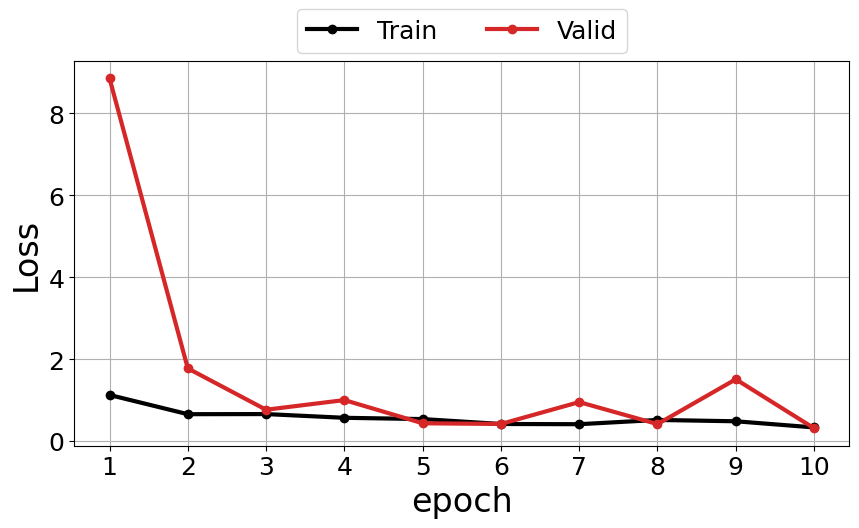

In [35]:
my_classifier.plot_metric(
    y_axis=["epoch_loss_train", "epoch_loss_val"],
    y_label="Loss",
    legends=["Train", "Valid"],
)

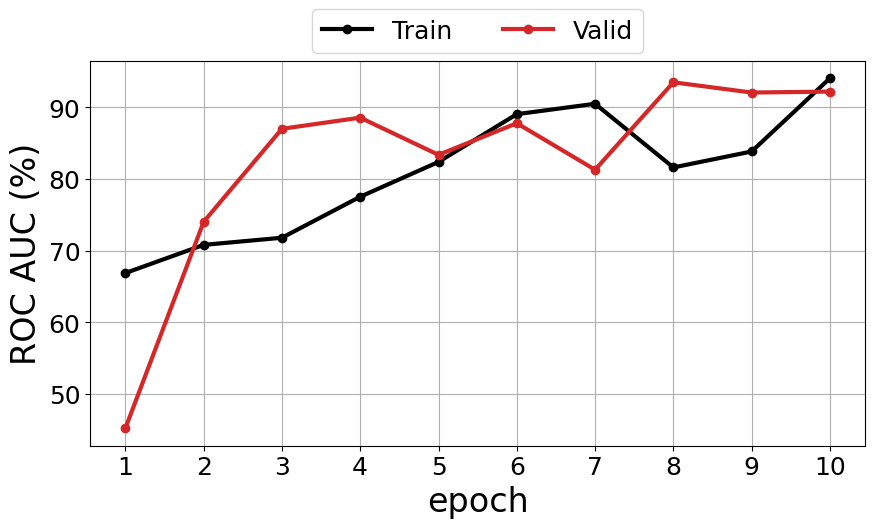

In [36]:
my_classifier.plot_metric(
    y_axis=["epoch_rocauc_macro_train", "epoch_rocauc_macro_val"],
    y_label="ROC AUC (%)",
    legends=["Train", "Valid"],
    colors=["k", "tab:red"],
)

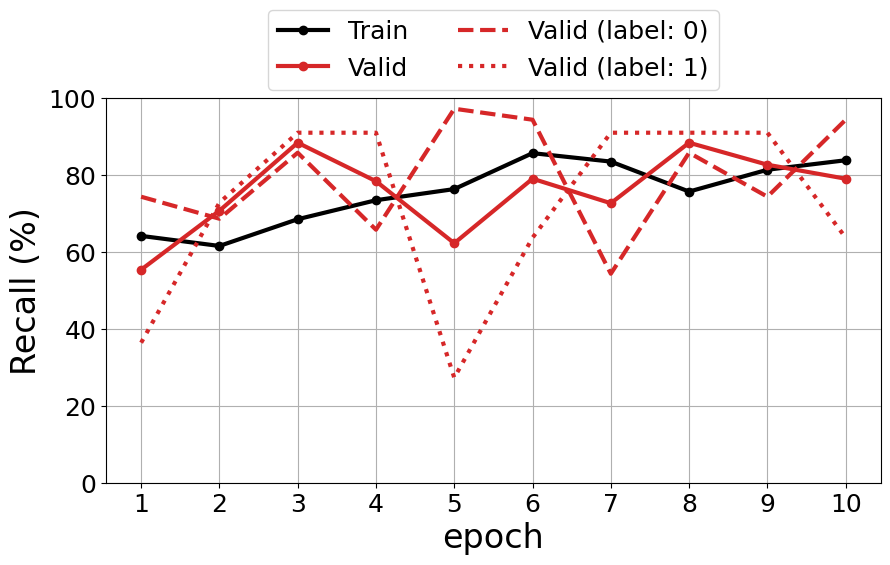

In [37]:
my_classifier.plot_metric(
    y_axis=[
        "epoch_recall_macro_train",
        "epoch_recall_macro_val",
        "epoch_recall_0_val",
        "epoch_recall_1_val",
    ],
    y_label="Recall (%)",
    legends=[
        "Train",
        "Valid",
        "Valid (label: 0)",
        "Valid (label: 1)",
    ],
    colors=["k", "tab:red", "tab:red", "tab:red"],
    styles=["-", "-", "--", ":"],
    markers=["o", "o", "", ""],
    plt_yrange=[0, 100],
)

# Model inference

Here, we show how to load an already trained/fine-tuned model and a dataset and then do model inference.

## Load patches and add metadata

In [41]:
from mapreader import load_patches

In [42]:
my_maps = load_patches(
    "./patches_100_pixel/*74488689*png", parent_paths="./maps/map_74488689.png"
)

my_maps.add_metadata("./maps/metadata.csv", ignore_mismatch=True)
my_maps.add_metadata("patch_df.csv", tree_level="patch", ignore_mismatch=True)

0it [00:00, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4275 [00:00<?, ?it/s]

In [43]:
parent_df, patch_df = my_maps.convert_images()

## Create dataset from patches

In [44]:
from mapreader import PatchDataset

In [45]:
patch_dataset = PatchDataset(patch_df, transform="val")

## Load dataset in to new Classifier (or use existing one if continuing with notebook)

In [46]:
from mapreader import ClassifierContainer

In [48]:
my_classifier = ClassifierContainer(
    model=None,
    labels_map=None,
    load_path="./models_tutorial/checkpoint_10.pkl",
)

[INFO] Device is set to cpu
[INFO] Loading "/Users/rwood/LwM/mapreader/MapReader/worked_examples/geospatial/classification_one_inch_maps/models_tutorial/checkpoint_10.pkl".
[INFO] Loaded "train" with 161 items.
[INFO] Loaded "val" with 46 items.
[INFO] Loaded "test" with 23 items.


In [49]:
my_classifier.load_dataset(
    patch_dataset, set_name="patches", batch_size=8, shuffle=False
)

In [50]:
my_classifier.print_batch_info(set_name="patches")

[INFO] dataset: patches
        - items:        4275
        - batch size:   8
        - batches:      535



## Inference

In [51]:
my_classifier.inference(set_name="patches")

[INFO] Each step will pass: ['patches'].
2024-02-22 08:49:20 599-JY5FK6 [INFO] patches  -- 11/11 --     8/4275 (  0.2% ) -- 
2024-02-22 08:49:20 599-JY5FK6 [INFO] patches  -- 11/11 --    48/4275 (  1.1% ) -- 
2024-02-22 08:49:21 599-JY5FK6 [INFO] patches  -- 11/11 --    88/4275 (  2.1% ) -- 
2024-02-22 08:49:22 599-JY5FK6 [INFO] patches  -- 11/11 --   128/4275 (  3.0% ) -- 
2024-02-22 08:49:22 599-JY5FK6 [INFO] patches  -- 11/11 --   168/4275 (  3.9% ) -- 
2024-02-22 08:49:23 599-JY5FK6 [INFO] patches  -- 11/11 --   208/4275 (  4.9% ) -- 
2024-02-22 08:49:23 599-JY5FK6 [INFO] patches  -- 11/11 --   248/4275 (  5.8% ) -- 
2024-02-22 08:49:24 599-JY5FK6 [INFO] patches  -- 11/11 --   288/4275 (  6.7% ) -- 
2024-02-22 08:49:24 599-JY5FK6 [INFO] patches  -- 11/11 --   328/4275 (  7.7% ) -- 
2024-02-22 08:49:25 599-JY5FK6 [INFO] patches  -- 11/11 --   368/4275 (  8.6% ) -- 
2024-02-22 08:49:25 599-JY5FK6 [INFO] patches  -- 11/11 --   408/4275 (  9.5% ) -- 
2024-02-22 08:49:26 599-JY5FK6 [INF

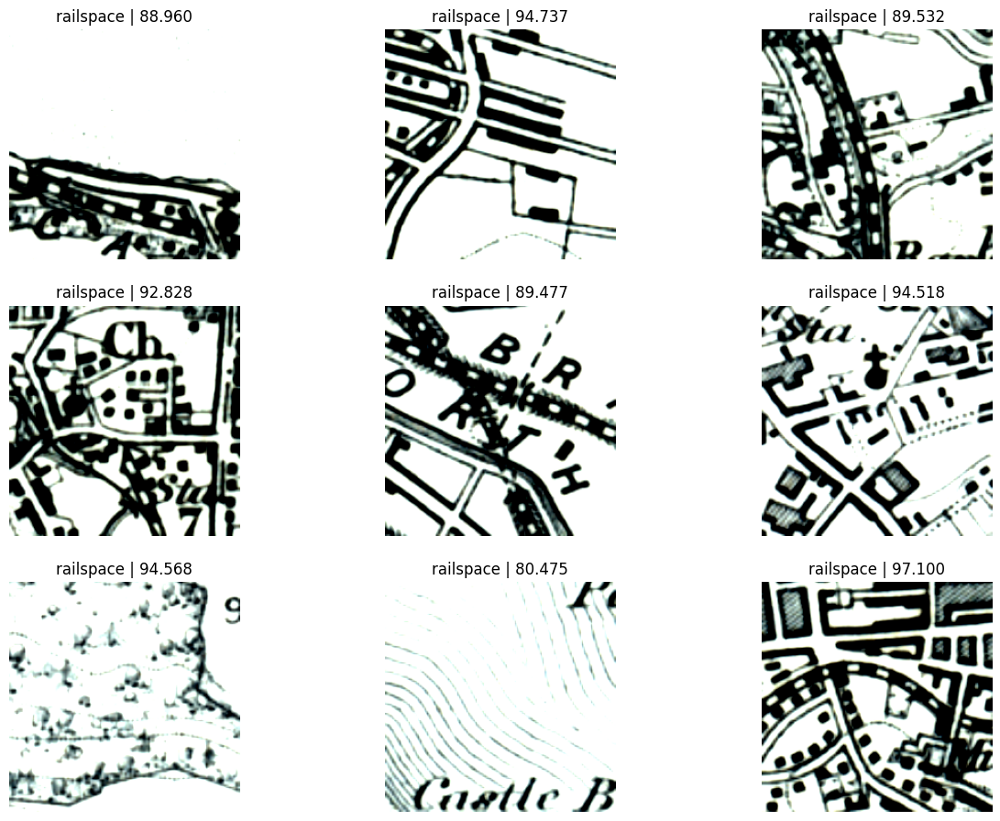

In [53]:
my_classifier.show_inference_sample_results(
    label="railspace", num_samples=9, set_name="patches", min_conf=80
)

## Add predictions to dataframe

In [54]:
predictions_df = patch_dataset.patch_df

In [55]:
import numpy as np
import pandas as pd

predictions_df["predicted_label"] = my_classifier.pred_label
predictions_df["pred"] = my_classifier.pred_label_indices
predictions_df["conf"] = np.array(my_classifier.pred_conf).max(axis=1)

predictions_df.head()

,parent_id,image_path,pixel_bounds,shape,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_A,image_id,predicted_label,pred,conf
image_id,,,,,,,,,,,,,,,,,,,
patch-4800-4700-4900-4800-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(4800, 4700, 4900, 4800)","(100, 100, 4)","(-4.4219970703125, 55.828939486026506, -4.4134...",EPSG:4326,POLYGON ((-4.413414001464844 55.82893948602650...,0.708448,0.694029,0.628624,1.0,0.192450,0.194525,0.179188,0.0,patch-4800-4700-4900-4800-#map_74488689.png#.png,No,0,0.598768
patch-1700-200-1800-300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1700, 200, 1800, 300)","(100, 100, 4)","(-4.688072204589844, 56.04534260453906, -4.679...",EPSG:4326,POLYGON ((-4.6794891357421875 56.0453426045390...,0.902684,0.889986,0.817024,1.0,0.055550,0.056337,0.053893,0.0,patch-1700-200-1800-300-#map_74488689.png#.png,No,0,0.988162
patch-300-500-400-600-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(300, 500, 400, 600)","(100, 100, 4)","(-4.808235168457031, 56.030915729971554, -4.79...",EPSG:4326,POLYGON ((-4.799652099609375 56.03091572997155...,0.780055,0.768753,0.704215,1.0,0.118848,0.120624,0.114077,0.0,patch-300-500-400-600-#map_74488689.png#.png,No,0,0.989026
patch-2000-3500-2100-3600-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2000, 3500, 2100, 3600)","(100, 100, 4)","(-4.662322998046875, 55.88664698429652, -4.653...",EPSG:4326,POLYGON ((-4.653739929199219 55.88664698429652...,0.835125,0.819675,0.744910,1.0,0.119352,0.119904,0.111668,0.0,patch-2000-3500-2100-3600-#map_74488689.png#.png,No,0,0.972786
patch-6200-4400-6300-4500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(6200, 4400, 6300, 4500)","(100, 100, 4)","(-4.3018341064453125, 55.84336636059401, -4.29...",EPSG:4326,POLYGON ((-4.293251037597656 55.84336636059401...,0.671154,0.655859,0.590913,1.0,0.213728,0.216932,0.199242,0.0,patch-6200-4400-6300-4500-#map_74488689.png#.png,railspace,1,0.660495


## Add outputs to `MapImages` as metadata

In [60]:
my_maps.add_metadata(predictions_df, tree_level="patch")

In [61]:
my_maps.add_shape()

[INFO] Add shape, tree level: parent


In [62]:
parent_df, patch_df = my_maps.convert_images()
parent_df.head()

,parent_id,image_path,patches,name,url,coordinates,crs,published_date,grid_bb,shape
image_id,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,[patch-4800-4700-4900-4800-#map_74488689.png#....,map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.78892895389263, -4.196777343...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","(5632, 7424, 4)"


  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 1500x1500 with 2 Axes>]

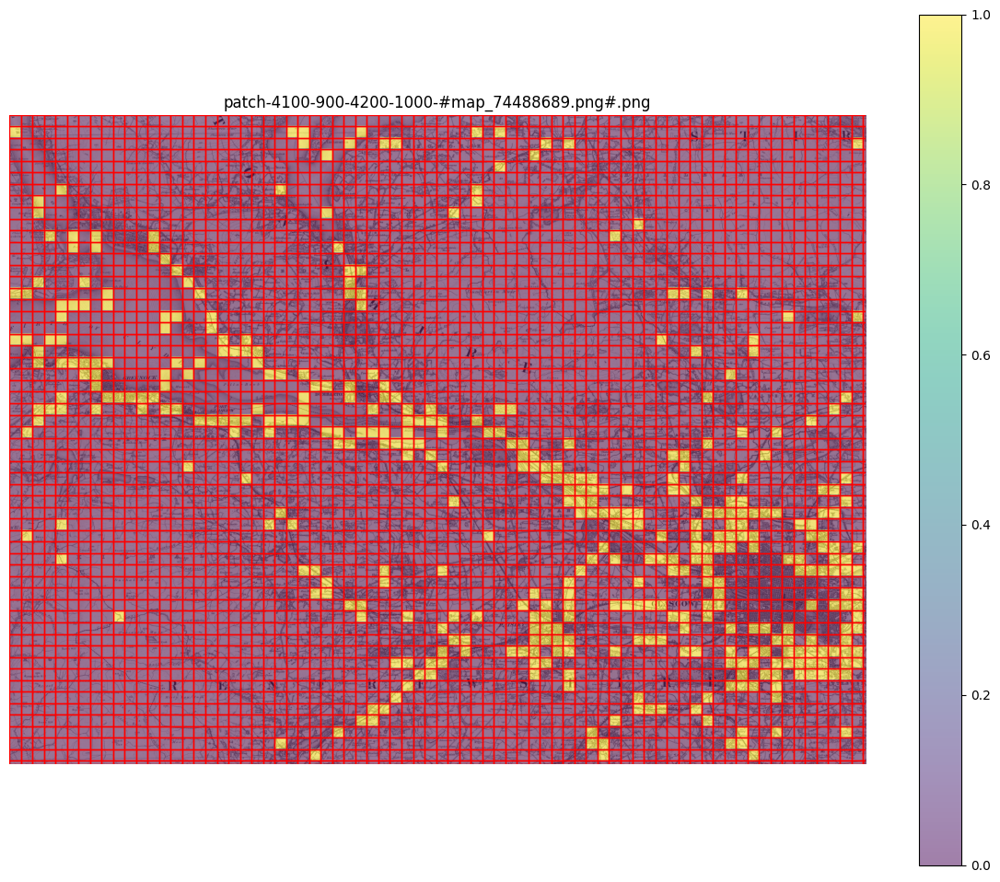

In [63]:
parent_list = my_maps.list_parents()

my_maps.show_parent(
    parent_list[0],
    column_to_plot="pred",
    patch_border=True,
    plot_parent=True,
    figsize=(15, 15),
    alpha=0.5,
)

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 1500x1500 with 2 Axes>]

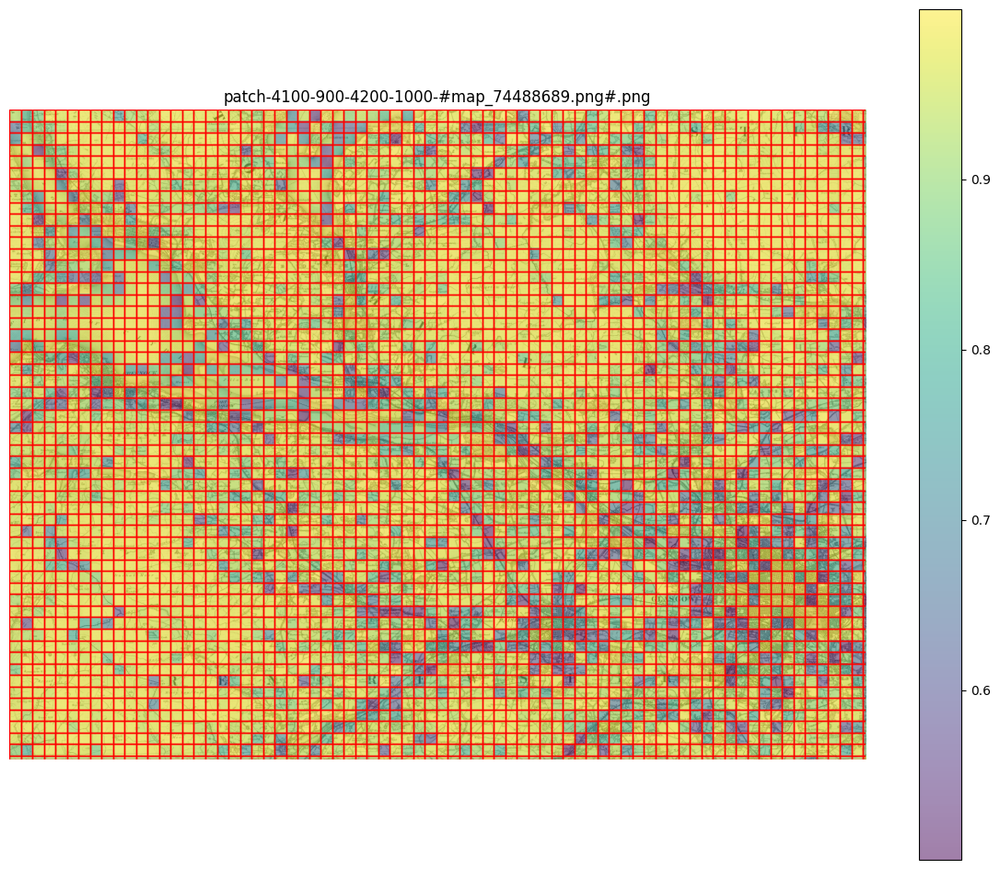

In [64]:
parent_list = my_maps.list_parents()

my_maps.show_parent(
    parent_list[0],
    column_to_plot="conf",
    patch_border=True,
    plot_parent=True,
    figsize=(15, 15),
    alpha=0.5,
)